In [10]:
import pickle
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import plotly.express as px
import plotly.io as pio
pio.renderers.default='notebook'
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import seaborn as sns
import math

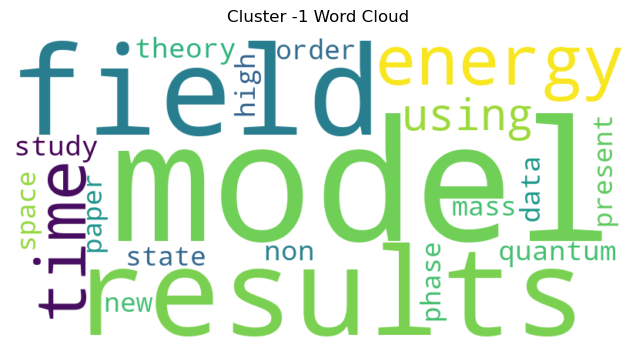

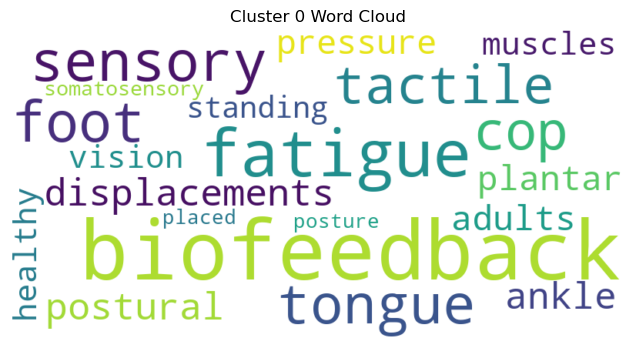

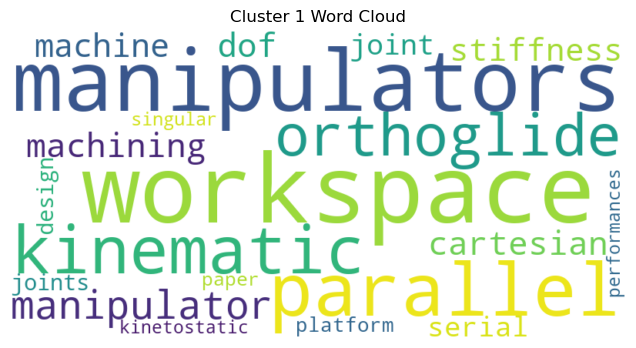

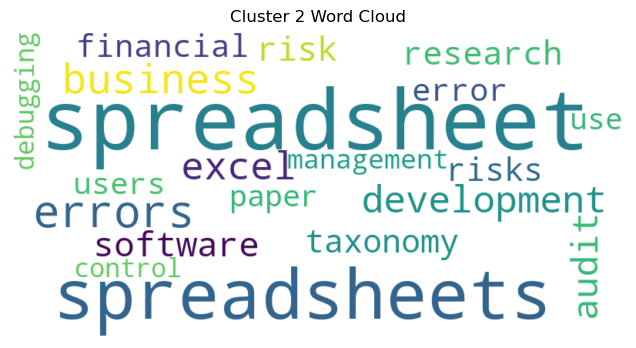

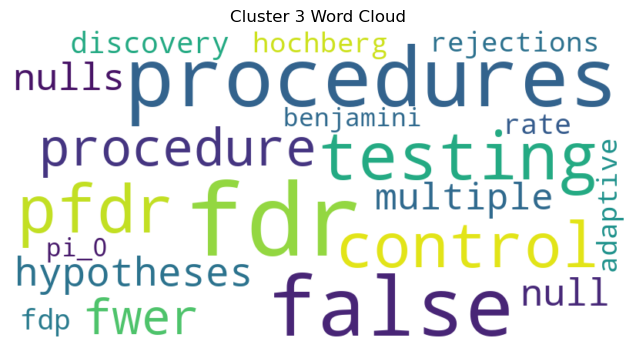

...

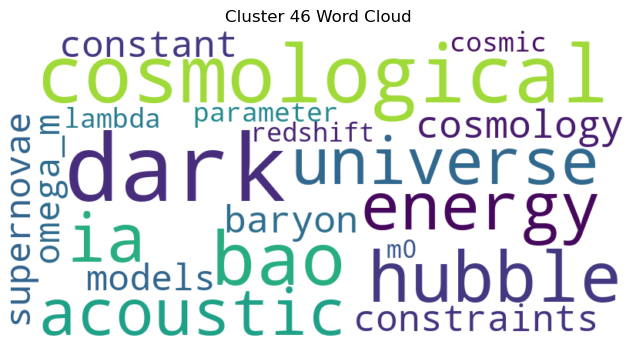

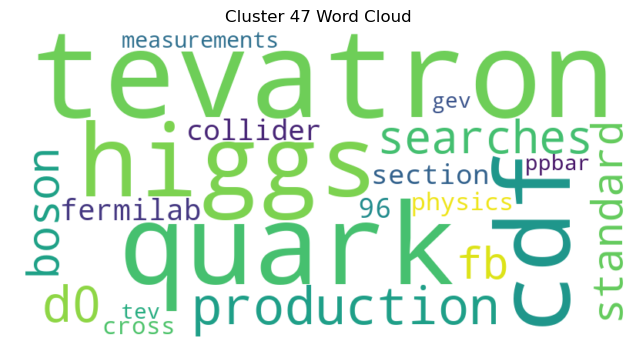

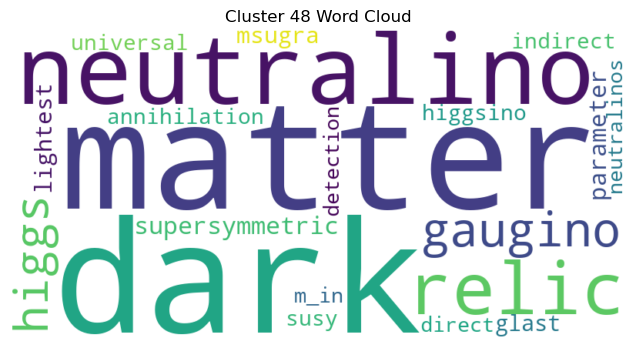

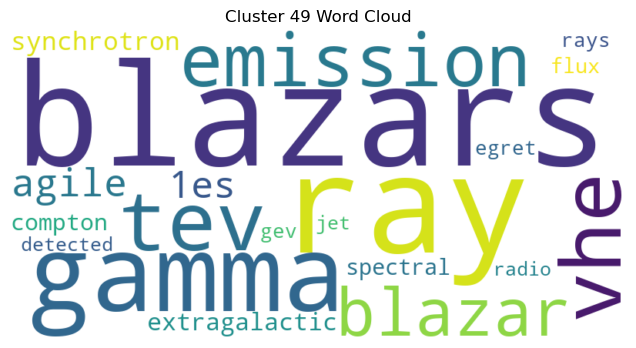

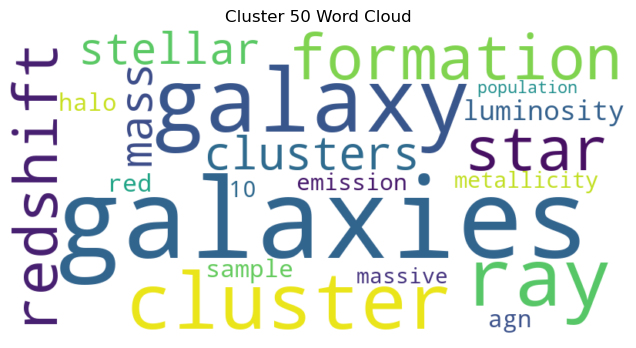

In [5]:
clusters = pickle.load(open(f'top_n_words.pkl', 'rb'))
# Create word clouds for each cluster
for cluster_id, words in clusters.items():
    word_freq = {word: freq for word, freq in words}
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    # Plot the word cloud
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Cluster {cluster_id} Word Cloud")
    plt.axis('off')
    plt.show()

In [6]:

# Compute the number of rows and columns based on the number of clusters
num_clusters = len(clusters)
num_cols = 2
num_rows = math.ceil(num_clusters / num_cols)

# Adjust the size of each subplot
subplot_width = 900
subplot_height = 400

# Create subplot titles based on cluster indices
subplot_titles = [f"Cluster {cluster_id}" for cluster_id in clusters.keys()]

# Initialize the subplot figure
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=subplot_titles)

# Add subplots for each cluster
for i, (cluster_id, words) in enumerate(clusters.items()):
    row = i // num_cols + 1  # Calculate the row position
    col = i % num_cols + 1   # Calculate the column position

    # Extract the top 10 words and frequencies for the cluster
    top_n_words = words[:10]
    words, frequencies = zip(*top_n_words)

    # Create the bar plot for the current cluster
    fig.add_trace(
        go.Bar(x=words, y=frequencies),
        row=row, col=col
    )

# Update the layout and display the figure
fig.update_layout(
    height=num_rows * subplot_height,
    width=subplot_width,
    title_text="Top words per cluster",
    showlegend=False
)
fig.show()

## 

"""
import plotly.graph_objects as go

def visualize_topics_per_class(clusters,
                               title: str = "<b>Topics per Class</b>",
                               width: int = 1250,
                               height: int = 900) -> go.Figure:
    """ Visualize topics per class using Plotly bar chart
    
    Arguments:
        clusters: A dictionary containing the topics per class and their corresponding weights.
        title: Title of the plot.
        width: The width of the figure.
        height: The height of the figure.
    
    Returns:
        A plotly.graph_objects.Figure including all traces
    """
    
    fig = go.Figure()
    
    for cluster, topics in clusters.items():
        topic_names = [topic[0] for topic in topics]
        topic_frequencies = [topic[1] for topic in topics]
        
        fig.add_trace(go.Bar(x=topic_names, y=topic_frequencies, name=f"Cluster {cluster}"))
    
    fig.update_layout(
        title=title,
        xaxis=dict(title='Topic'),
        yaxis=dict(title='Frequency'),
        width=width,
        height=height,
        barmode='stack'
    )
    
    return fig

 Call the function to visualize topics per class
fig = visualize_topics_per_class(clusters)
fig.show()
"""

"""import plotly.graph_objects as go

def visualize_topics_per_class(clusters,
                               title: str = "<b>Topics per Class</b>",
                               width: int = 1250,
                               height: int = 900) -> go.Figure:
    """ Visualize topics per class using Plotly bar chart
    
    Arguments:
        clusters: A dictionary containing the topics per class and their corresponding weights.
        title: Title of the plot.
        width: The width of the figure.
        height: The height of the figure.
    
    Returns:
        A plotly.graph_objects.Figure including all traces
    """
    
    fig = go.Figure()
    
    for cluster, topics in clusters.items():
        topic_names = [topic[0] for topic in topics]
        topic_frequencies = [topic[1] for topic in topics]
        
        fig.add_trace(go.Bar(x=topic_names, y=topic_frequencies, name=f"Cluster {cluster}"))
    
    fig.update_layout(
        title=title,
        xaxis=dict(title='Topic'),
        yaxis=dict(title='Frequency'),
        width=width,
        height=height,
        barmode='stack',
        legend=dict(
            title='Clusters',
            orientation='h',
            yanchor='top',
            y=1.05,
            xanchor='right',
            x=1
        )
    )
    
    return fig

 Call the function to visualize topics per class
fig = visualize_topics_per_class(clusters)
fig.show()
"""